In [1]:
using DelimitedFiles
using StatsBase 
using Random
using Statistics
using LinearAlgebra
using Plots
using LaTeXStrings
using Printf
using Measures
rng = Random.MersenneTwister(1234);

In [2]:
include("../src/common/common_Bezier.jl");
include("../src/common/common_analysis.jl");

In [3]:
# Parameters
myfontsize=16;
figure_width = 900;

# Wright-Fisher model 

## Fig.1. Interpolation curves for a WF trajectory

In [4]:
# Read a trajectory file.
id_seq = 2
allels_series = readdlm("../out/WF/WF_trajectories/WF-trajectory_id-"*string(id_seq)*".txt")';

In [5]:
# Apply linear and Bezier interpolation to the trajectory.
t_upto = 300
Δt = 50
i = 1 #rand(1:50) 
@printf("show a single site trajectory at i=%d of ensemble id=%d\n", i, id_seq)

p_set0 = allels_series[i,:]
p_set = allels_series[i,1:Δt:(t_upto+3)]
Nobserved = size(p_set,1)-1
(a_vec, b_vec) = get_a_b_Bezier(Nobserved,p_set);
p_set_left = p_set[1:Nobserved]
p_set_right = p_set[2:(Nobserved+1)];

# Drawing Bézier curve
t= 0.5
n=1
n_grid = 100; grid_scale=1.0/n_grid
Bez_curve = Bez.(collect(0:n_grid)*grid_scale, p_set_left[n], p_set_right[n], a_vec[n], b_vec[n])
for n in 2:Nobserved
    Bez_curve = vcat(Bez_curve, Bez.(collect(0:n_grid)*grid_scale, p_set_left[n], p_set_right[n], a_vec[n], b_vec[n]))
end;
#For visiualization
xAxis = [1+i*grid_scale for i in 0:n_grid]
for n in 2:(Nobserved)
    xAxis = vcat(xAxis, [1+(n-1)+ i*grid_scale for i in 0:n_grid])
end;    

show a single site trajectory at i=1 of ensemble id=2


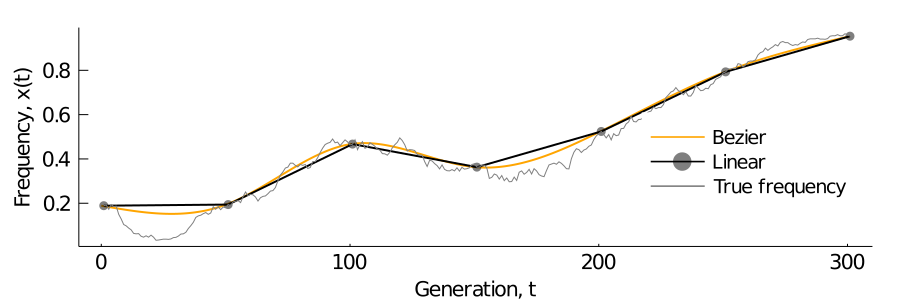

In [6]:
Plots.plot( (t_upto+1)/(t_upto/Δt)*(xAxis .-1), Bez_curve, size=(600, 200), c="orange", label="Bezier", linewidth=2)
Plots.plot!(collect(1:Δt:(t_upto+3)), p_set, marker=:circle, c="black", label="Linear", linewidth=2)
p1 = Plots.plot!(p_set0, markeralpha=0.1, c="gray", label="True frequency")

Plots.plot(p1, layout=(1,1),
    xlabel="Generation, t",
    ylabel="Frequency, x(t)",
    fontsize=14,
    markeralpha=0.5,
    markersize=5,
    labelfontsize=14,
    legendfontsize=8,
    xticks=(0:100:t_upto),
    tickfont=14,
    margin=5mm,
    grid=:false,
    legendfont=13,
    leg =(0.8, 0.5),
    foreground_color_legend = nothing,
    size=(figure_width,300)
    )

#Plots.savefig("../fig/WF/aleles-evolution_Bezier_interpolation.pdf")


## Fig.2 infer selection coefficient for a single ensemble Wright Fisher trajectories

In [7]:
##### Read estimated selection cofficient files. ####

L=50
time_steps = [1, 10, 30, 60, 75, 80, 100, 95]
gamma_set = [0, 1e-3, 0.1, 0.5, 1, 2, 5, 10, 30]
n_ensemble = 100
n_time_steps = size(time_steps,1)
n_gamma_max = size(gamma_set, 1)

selections_raw_Lin = readdlm("../out/WF/selections_multiple_Dt_reg_cases_Lin.dat")
selections_raw_Bez = readdlm("../out/WF/selections_multiple_Dt_reg_cases_Bez.dat");
selections_raw_naive = readdlm("../out/WF/selections_multiple_Dt_reg_cases_naive.dat");

selections_L = zeros(n_time_steps, n_ensemble, n_gamma_max, L)
selections_B = zeros(n_time_steps, n_ensemble, n_gamma_max, L)
selections_naive = zeros(n_time_steps, n_ensemble, n_gamma_max, L)
selections_L_SL = zeros(n_time_steps, n_ensemble, n_gamma_max, L)
selections_B_SL = zeros(n_time_steps, n_ensemble, n_gamma_max, L)
selections_naive_SL = zeros(n_time_steps, n_ensemble, n_gamma_max, L);

# Reallocate the selections
for k in 1:size(selections_raw_Lin,1)
    # Reallocate Linear selctions
    xL = selections_raw_Lin[k, :]
    n_t, n_reg, n, i = Int(xL[1]), Int(xL[3]), Int(xL[5]), Int(xL[6])
    v_MPL, v_SL = xL[7], xL[8]
    selections_L[n_t, n, n_reg, i] = v_MPL
    selections_L_SL[n_t, n, n_reg, i] = v_SL

    # Reallocate Bezier selctions    
    xB = selections_raw_Bez[k, :]
    n_t, n_reg, n, i = Int(xB[1]), Int(xB[3]), Int(xB[5]), Int(xB[6])
    v_MPL, v_SL = xB[7], xB[8]
    selections_B[n_t, n, n_reg, i] = v_MPL
    selections_B_SL[n_t, n, n_reg, i] = v_SL
    
    # Reallocate naive selctions            
    xN = selections_raw_naive[k, :]
    n_t, n_reg, n, i = Int(xN[1]), Int(xN[3]), Int(xN[5]), Int(xN[6])
    v_MPL, v_SL = xN[7], xN[8]
    selections_naive[n_t, n, n_reg, i] = v_MPL
    selections_naive_SL[n_t, n, n_reg, i] = v_SL
end

selections_raw_Lin=[]; selections_raw_naive=[]; selections_raw_Bez=[];

In [8]:
#### Make positive predictive value curves ####
n_gamma=3
indices_B = collect(1:10)
indices_N = collect(11:40)
indices_D = collect(41:L)

TPR_B_B_set, TPR_B_D_set = [], []
TPR_L_B_set, TPR_L_D_set = [], []
TPR_naive_B_set, TPR_naive_D_set = [], []

for n_DT in 1:size(time_steps,1)
    (TPR_B_B_DT, TPR_B_D_DT) = get_TPR_curve_bene(vec(selections_B[n_DT,:, n_gamma, indices_B]), vec(selections_B[n_DT,:, n_gamma, indices_N]), vec(selections_B[n_DT,:, n_gamma,indices_D]))
    (TPR_L_B_DT, TPR_L_D_DT) = get_TPR_curve_bene(vec(selections_L[n_DT,:, n_gamma, indices_B]), vec(selections_L[n_DT,:, n_gamma, indices_N]), vec(selections_L[n_DT,:, n_gamma, indices_D]))
    (TPR_naive_B_DT, TPR_naive_D_DT) = get_TPR_curve_bene(vec(selections_naive[n_DT,:, n_gamma, indices_B]), vec(selections_naive[n_DT,:, n_gamma, indices_N]), vec(selections_naive[n_DT,:, n_gamma, indices_D]))
    
    TPR_B_B_set = push!(TPR_B_B_set, TPR_B_B_DT)
    TPR_B_D_set = push!(TPR_B_D_set, TPR_B_D_DT)
    
    TPR_L_B_set = push!(TPR_L_B_set, TPR_L_B_DT)
    TPR_L_D_set = push!(TPR_L_D_set, TPR_L_D_DT)

    TPR_naive_B_set = push!(TPR_naive_B_set, TPR_naive_B_DT)
    TPR_naive_D_set = push!(TPR_naive_D_set, TPR_naive_D_DT)
end

In [9]:
### set true selection coefficiens ###
means_true = zeros(L)
for i in 1:L
    if(i<=10)
        means_true[i] = 0.03
    end
    if(i>40)
        means_true[i] = -0.03
    end
end

In [10]:
###---- Read a file of an ensemble of trajectories -----###
n_sample = 2
fname_in = "../out/WF/WF_trajectories/WF-trajectory_id-"*string(n_sample)*".txt"
allels_series = readdlm(fname_in)';


In [11]:
###------ Make Fig.2.a -----###
n_DT = 5

index_temp = collect(0:300) .% time_steps[n_DT] .== 0;
x_axis_temp = collect(1:301)[ index_temp ]

nB,nD=10, 10 # number of beneficial and deleterious 

Plots.plot(allels_series[1,1:301],  color="red", label=:false, msc="red")
Plots.scatter!(x_axis_temp, allels_series[1,index_temp],  color="red", label="Beneficial", markersize=5, msc="red")
for i in 2:(L-1)
    if(i<=nB)
        Plots.plot!(allels_series[i,1:301],  color="red", label=:false, msc="red")
        Plots.scatter!(x_axis_temp, allels_series[i,index_temp],  color="red", label=:false, markersize=5, msc="red")
    end
    if(10<i && i<L-nD)
        Plots.plot!(allels_series[i,1:301],  color="gray", label=:false, msc="gray")
        Plots.scatter!(x_axis_temp, allels_series[i,index_temp],  color="gray", label=:false, markersize=5, msc="gray")
        if(i==25)
            Plots.scatter!(x_axis_temp, allels_series[i,index_temp],  color="gray", label="Neutral", markersize=5, msc="gray")
        end
    end
    if(L-10<=i)
        Plots.plot!(allels_series[i,1:301],  color="blue", label=:false, msc="blue")
        Plots.scatter!(x_axis_temp, allels_series[i,index_temp],  color="blue", label=:false, markersize=5, msc="blue")
    end
end
Plots.plot!(allels_series[L,1:301],  color="gray", label=:false, msc="gray")
p1 = Plots.scatter!(x_axis_temp, allels_series[L,index_temp], color="blue", label="Deletrious", markersize=5, msc="blue")


p1_tot = Plots.plot(p1, layout=(1,1),
    xticks=:all, 
    xlabel="Generation, t",
    ylabel="Frequency, x(t)",
    fontsize=14,
    line=:true, 
    markerstrokewidth=0,
    linewidth=0.5,
    legend=:false,
    markeralpha=0.5,
    labelfontsize=14,
    linealpha=0.4,
    legendfontsize=14,
    tickfont=14,
    grid=:false,
    legendfont=14,
    margin=5mm,
    foreground_color_legend = nothing,
    size=(figure_width,300)
    );


In [12]:
###---- read errorbars -----###

errorbar_Bez_temp = readdlm("../out/WF/error_bar_multiple_Dt_reg_cases_Bez.dat")
errorbar_Lin_temp = readdlm("../out/WF/error_bar_multiple_Dt_reg_cases_Lin.dat");

errorbar_Bez = zeros(40000, n_ensemble, L)
errorbar_Lin = zeros(40000, n_ensemble, L);

for k in 1:size(errorbar_Bez_temp,1)
    # Reallocate Linear selctions
    xB = errorbar_Bez_temp[k, :]
    n_t, n, i = Int(xB[1]), Int(xB[3]), Int(xB[4])
    v = xB[5]
    errorbar_Bez[n_t, n, i] = v 
    
    xL = errorbar_Lin_temp[k, :]
    n_t, n, i = Int(xL[1]), Int(xL[3]), Int(xL[4])
    v = xL[5]
    errorbar_Lin[n_t, n, i] = v
end

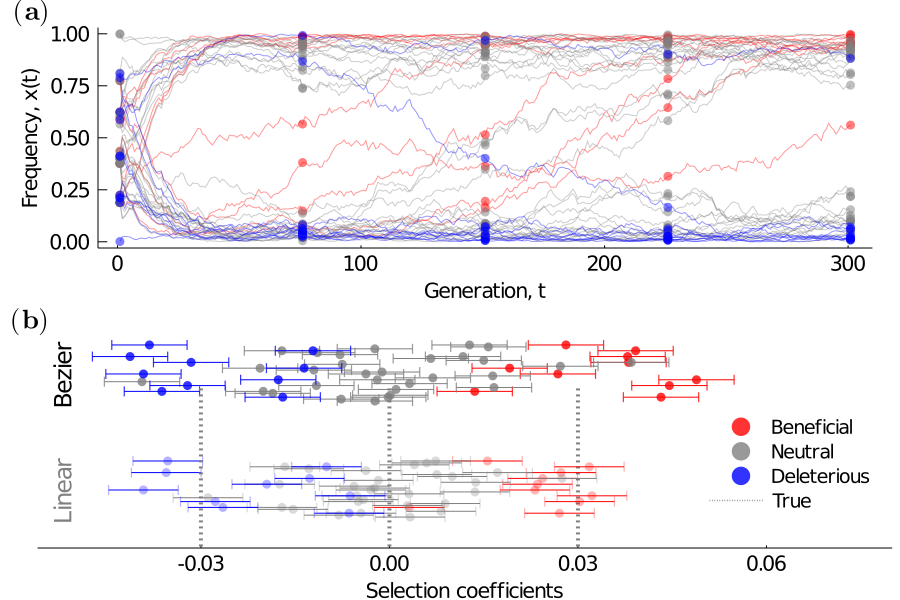

In [13]:
# this is temp. using the 


x_min, x_max = -0.1, 0.1
y_shift=2

means_Bez = selections_B[n_DT, n_sample, n_gamma, :]
stds_Bez = sqrt.(errorbar_Bez[n_DT, n_sample, :])
stds_Bez = copy(1.0/stds_Bez)

means_Lin = selections_L[n_DT, n_sample, n_gamma, :]
stds_Lin = sqrt.(errorbar_Lin[n_DT, n_sample, :])
stds_Lin = copy(1.0/stds_Lin)

x_axis = collect(1:10)/10
x_axis2 = collect(-33:3)/10

# ---- Make background true selection lines -----#
Plots.plot(0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false, msc="gray")
Plots.plot!(zeros(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false, msc="gray")


#-------- Beneficial----------#
x_mean=mean(vec(selections_B[n_DT,:, n_gamma, indices_B]))
x_std=std(vec(selections_B[n_DT,:, n_gamma, indices_B]))

Plots.scatter!(means_Bez[indices_B], x_axis, xerror=stds_Bez, 
    c="red", markersize=6, markeralpha=0.8,
    marker=:circle , line=:false, label="Beneficial", msc="red")


Plots.scatter!(means_Lin[indices_B], x_axis .- y_shift, xerror=stds_Lin, 
    c="red", markersize=6,
    marker=:circle , line=:false, label=:false, markeralpha=0.3, msc="red")

#-------- Neutral ----------#
x_mean=mean(vec(selections_B[n_DT,:, n_gamma, indices_N]))
x_std=std(vec(selections_B[n_DT,:, n_gamma, indices_N]))
x_axis = collect(1:30)/30


Plots.scatter!(means_Bez[indices_N], x_axis, xerror=stds_Bez, 
    c="gray", markersize=6, markeralpha=0.8,
    marker=:circle , line=:false, label="Neutral", msc="gray")

Plots.scatter!(means_Lin[indices_N], x_axis .- y_shift, xerror=stds_Lin, 
    c="gray", markersize=6,
    marker=:circle , line=:false, label=:false, markeralpha=0.3, msc="gray")

#-------- Deleterious ----------#
x_mean=mean(vec(selections_B[n_DT,:, n_gamma, indices_D]))
x_std=std(vec(selections_B[n_DT,:, n_gamma, indices_D]))
x_axis = collect(1:10)/10


Plots.scatter!(means_Bez[indices_D], x_axis, xerror=stds_Bez, 
    c="blue", markersize=6, markeralpha=0.8, 
    marker=:circle , line=:false, label="Deleterious", msc="blue")

Plots.scatter!(means_Lin[indices_D], x_axis .- y_shift, xerror=stds_Lin, 
    c="blue", markersize=6,
    marker=:circle , line=:false, label=:false, markeralpha=0.3, legend=:bottomleft, ylim=(-2.5,1.3), xlim=(-0.056, 0.08), msc="blue")

p2 = Plots.plot!(-0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label="True",markerstrokewidth=0, msc="gray")

annotate!(-0.052, 0.5, Plots.text("Bezier", 16, rotation=90))
annotate!(-0.052, -1.5, Plots.text("Linear", 16, color="gray", rotation=90))


p2_tot = Plots.plot(p2, layout=(1,1),
    xticks=:all, 
    xlabel="Selection coefficients",
    fontsize=14,
    markersize=5,
    labelfontsize=14,
    legendfontsize=14,
    tickfont=14,
    grid=:false,
    legendfont=13,
    yaxis=:false,
    margin=0mm,
    markerstrokewidth=0,
    background_color_legend = nothing,
    leg=(0.86,0.55),
    foreground_color_legend = nothing,
    size=(figure_width,300)
    )
Plots.plot(p1_tot,p2_tot, layout=(2,1), size=(900,600))

annotate!(-42, 1.1, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(-0.06, 1.4, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2)

#Plots.savefig("../fig/WF/WF_trajectory_selections.pdf")

## Fig.3 infer selection coefficient for multiple ensembles of Wright Fisher trajectories

In [14]:
###----- Make Fig.3.a-b -----####

Plots.plot(TPR_B_D_set[n_DT][1:2000], linewidth=1, linestyle=:solid, c="blue", label="Bezier")
p2 = Plots.plot!(TPR_L_D_set[n_DT][1:2000], linewidth=1, linestyle=:solid, linealpha=0.3, c="blue", label="Linear", 
                title=@sprintf("Deleterious, Δt=%d",time_steps[n_DT]), ylabel="PPV", legend=:bottom)

Plots.plot(TPR_B_B_set[n_DT][1:2000], linewidth=1, linestyle=:solid, c="red", label="Bezier")
p1 = Plots.plot!(TPR_L_B_set[n_DT][1:2000], linewidth=1, linestyle=:solid, linealpha=0.3, c="red", label="Linear" ,
                title=@sprintf("Beneficial, Δt=%d",time_steps[n_DT]),
                xlabel="")

p_set = Plots.plot(p2,p1,layout=(1,2), size=(figure_width, 300),
            xlim=(1,1300),
            fontsize=14,
            xlabel="Rank",
            labelfontsize=14,
            tickfontsize=14,
            foreground_color_legend = nothing,
            legendfontsize=14,
            #legend=:bottomleft,
            leg =(0.7, 0.35),
            xticklength=11,
            margin=5mm,
            grid=false,
            ylim=(0.63,1),
            xaxis=:log)

annotate!(0.2, 1.05, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(0.2, 1.05, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2);

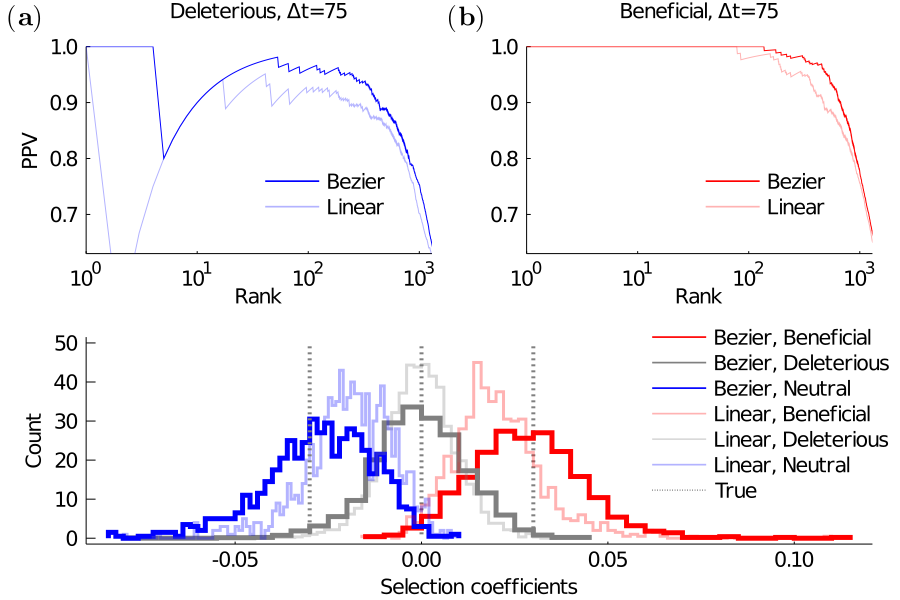

In [15]:
###----- Make Fig.3 -----####

n_DT = 5
n_gamma=2

x_axis2 = collect(1:50) 
Plots.plot(0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false)
Plots.plot!(zeros(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false)

Plots.plot!(vec(selections_B[n_DT,:, n_gamma, indices_B]), seriestype=:stephist,linewidth=5, linestyle=:solid, c="red", nbins=50, normalize=true, label="Bezier, Beneficial")
Plots.plot!(vec(selections_B[n_DT,:, n_gamma, indices_N]), seriestype=:stephist, linewidth=5, linestyle=:solid, c="gray", nbins=50, normalize=true, label="Bezier, Deleterious")
Plots.plot!(vec(selections_B[n_DT,:, n_gamma, indices_D]), seriestype=:stephist, linewidth=5, linestyle=:solid, c="blue", nbins=50, normalize=true, label="Bezier, Neutral")

Plots.plot!(vec(selections_L[n_DT,:, n_gamma, indices_B]), seriestype=:stephist, linewidth=3, linealpha=0.3, linestyle=:solid, c="red", nbins=80, normalize=true, label="Linear, Beneficial")
Plots.plot!(vec(selections_L[n_DT,:, n_gamma, indices_N]), seriestype=:stephist, linewidth=3, linealpha=0.3,linestyle=:solid, c="gray", nbins=80, normalize=true, label="Linear, Deleterious")


Plots.plot!(vec(selections_L[n_DT,:, n_gamma, indices_D]), seriestype=:stephist, linewidth=3, linealpha=0.3,linestyle=:solid, c="blue", nbins=90, normalize=true, 
    label="Linear, Neutral", ylabel="Count", xlabel="Selection coefficients", leg =(0.8, 1))
p1 = Plots.plot!(-0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label="True")



Plots.plot(p_set, p1,layout=(2,1), size=(figure_width, 600), 
                fontsize=14,
                labelfontsize=14,
                tickfontsize=14,
                foreground_color_legend = nothing,
                legendfontsize=13.5,
                grid=false, 
                
)
annotate!(-0.122, 55, text(L"\mathbf{(c)}", :left, myfontsize+2), subplot=3)

#Plots.savefig("../fig/WF/selection_histogram_with_PPV.pdf")

## Fig.5 Interpolation error and autocorrelation function

In [42]:
#----- Read and set autocorrelation functions -----#
cov_error_Lin_mean = readdlm("../out/WF/covariance_error_Lin_mean.dat")
cov_error_Lin_std = readdlm("../out/WF/covariance_error_Lin_std.dat")
cov_error_Bez_mean = readdlm("../out/WF/covariance_error_Bez_mean.dat")
cov_error_Bez_std = readdlm("../out/WF/covariance_error_Bez_std.dat");

k = 1
index_selections = [1,2,3,4,5,7]
time_steps = [1, 10, 30, 60, 75, 80, 100]
n_time_steps=7
# this is taking k=1(Beneficial diag), k=2(neutral diag), and k=3(deleterious diag)
cov_error_Lin_mean_avg = [0.2*( sum(cov_error_Lin_mean[1, n])+sum(cov_error_Lin_mean[2, n])+3*sum(cov_error_Lin_mean[2, n]) ) for n in 1:n_time_steps]
cov_error_Bez_mean_avg = [0.2*( sum(cov_error_Bez_mean[1, n])+sum(cov_error_Bez_mean[2, n])+3*sum(cov_error_Bez_mean[2, n]) ) for n in 1:n_time_steps]
cov_error_Lin_std_avg = [0.2*( sum(cov_error_Lin_std[1, n])+sum(cov_error_Lin_std[2, n])+3*sum(cov_error_Lin_std[2, n]) )  for n in 1:n_time_steps]
cov_error_Bez_std_avg = [0.2*( sum(cov_error_Bez_std[1, n])+sum(cov_error_Bez_std[2, n])+3*sum(cov_error_Bez_std[2, n]) ) for n in 1:n_time_steps];

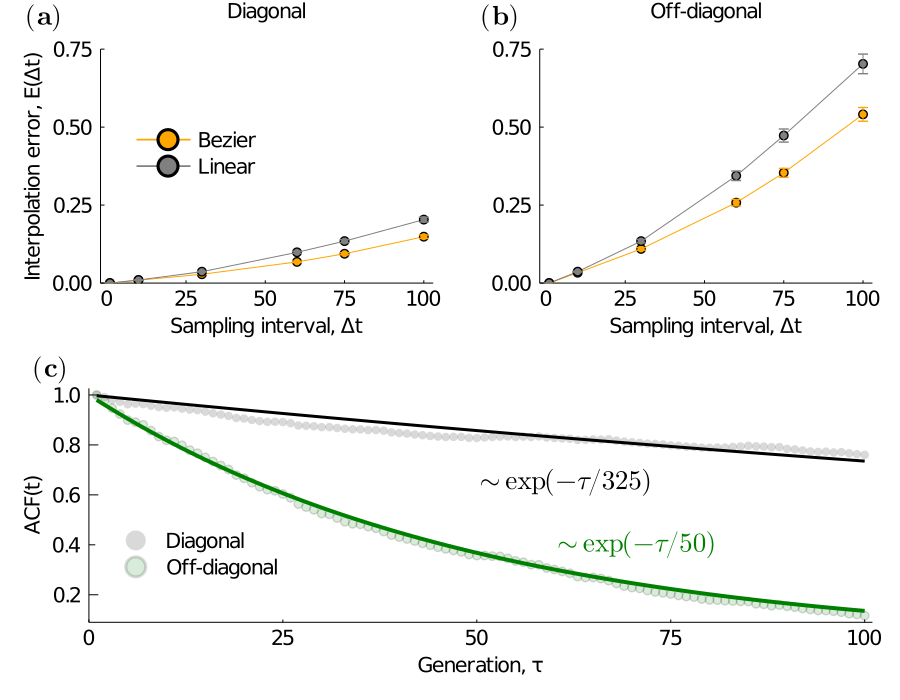

In [43]:
###=========== Make Fig.5.a-b ==============#
#------- Diagonal------#
index_selections = [1,2,3,4,5,7]
Plots.plot(time_steps[index_selections], cov_error_Bez_mean_avg[index_selections], c="orange",
    yerror=cov_error_Bez_std_avg[index_selections], marker=:circle, label="Bezier")
p1 =Plots.plot!(time_steps[index_selections], cov_error_Lin_mean_avg[index_selections], c="gray", 
    yerror=cov_error_Lin_std_avg[index_selections], marker=:circle, label="Linear", title="Diagonal", 
    ylabel="Interpolation error, E(Δt)", xlabel="Sampling interval, Δt",ylim=(0,1))
#------- Off-diagonal------#
k = 4
index_selections = [1,2,3,4,5,7]
Plots.plot(time_steps[index_selections], cov_error_Bez_mean[k, index_selections], c="orange",
    yerror=cov_error_Bez_std[k,index_selections], marker=:circle, label=:false)
p2 = Plots.plot!(time_steps[index_selections], cov_error_Lin_mean[k, index_selections], c="gray",
    yerror=cov_error_Lin_std[k,index_selections], marker=:circle, label=:false, title="Off-diagonal",
    ylabel="", xlabel="Sampling interval, Δt", ylim=(0,1))

p1_tot = Plots.plot(p1,p2,layout=(1,2), size=(figure_width, 300),
            fontsize=14,
            ylim=(0,0.75),
            labelfontsize=14,
            tickfontsize=14,
            foreground_color_legend = nothing,
            legendfontsize=14,
            legend=:left,
            margin=5mm,
            xticklength=14,
            grid=false
);

###=========== Make Fig.5.c ==============#
time_upto = 100
data_ACF = readdlm("../out/WF/autocorrelation_WF.dat")';
Plots.scatter( data_ACF[1, 1:time_upto]/maximum(data_ACF[1, 1:time_upto]), label="Diagonal", c="black", markeralpha=0.15)
Plots.scatter!( data_ACF[2, 1:time_upto]/maximum(data_ACF[2, 1:time_upto]), c="green", label="Off-diagonal", markeralpha=0.15)
Plots.plot!(exp.(-(1.0/325)*collect(1:time_upto)),c="black",linewidth=3, label=:false)
p2 = Plots.plot!(exp.(-(1.0/50)*collect(1:time_upto)),c="green",linewidth=4, label=:false)

# NOTE: Diagonal coefficient can be obtained by 
# y_regression = log.(data_ACF[3, 1:time_upto]/maximum(data_ACF[3, 1:time_upto]))
# x_regression = collect(1:100)
# linreg_expricit(vec(x_regression), vec(y_regression))

annotate!(50, 0.65, text(L"$\sim \exp(-\tau/325)$", :left, myfontsize+2))
annotate!(60, 0.4, text(L"$\sim \exp(-\tau/50)$", :left, myfontsize+2, color="green"))

p2_tot = Plots.plot(p2, layout=(1,1),
    xlim=(0,time_upto+1),
    xticks=:all, 
    xlabel="Generation, τ",
    ylabel="ACF(t)",
    fontsize=14,
    markersize=5,
    labelfontsize=14,
    legendfontsize=14,
    tickfont=14,
    legendfont=14,
    leg=(0.1,0.35),
    foreground_color_legend = nothing,
    margin=5mm,
    grid=:false,
    size=(900,500)
    );

Plots.plot(p1_tot, p2_tot, layout=(2,1),
    xticks=:all, 
    fontsize=14,
    markersize=5,
    labelfontsize=14,
    legendfontsize=14,
    tickfont=14,
    legendfont=14,
    foreground_color_legend = nothing,
    grid=:false,
    size=(figure_width,700)
    )
annotate!(-25, 0.85, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(-20, 0.85, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2)
annotate!(-7, 1.1, text(L"\mathbf{(c)}", :left, myfontsize+2), subplot=3)
annotate!(130, 0.5, text(L"$\sim \exp(-\tau/50)$", :left, myfontsize+2, color="green") , subplot=3)
annotate!(170, 0.85, text(L"$\sim \exp(-\tau/250)$", :left, myfontsize+2), subplot=3)

#Plots.savefig("../fig/interpolation_error_with_ACF.pdf")

## Supplementary Figures of Wright Fisher model

### Comparison between SL and MPL in terms of PPV 

In [18]:
#------  Make PPV curves for Merginal Pathl-likelihood (MPL) method -----#
n_gamma=3
indices_B = collect(1:10)
indices_N = collect(11:40)
indices_D = collect(41:L)

TPR_B_B_set, TPR_B_D_set = [], []
TPR_L_B_set, TPR_L_D_set = [], []
TPR_naive_B_set, TPR_naive_D_set = [], []

for n_DT in 1:size(time_steps,1)
    (TPR_B_B_DT, TPR_B_D_DT) = get_TPR_curve_bene(vec(selections_B[n_DT,:, n_gamma, indices_B]), vec(selections_B[n_DT,:, n_gamma, indices_N]), vec(selections_B[n_DT,:, n_gamma,indices_D]))
    (TPR_L_B_DT, TPR_L_D_DT) = get_TPR_curve_bene(vec(selections_L[n_DT,:, n_gamma, indices_B]), vec(selections_L[n_DT,:, n_gamma, indices_N]), vec(selections_L[n_DT,:, n_gamma, indices_D]))
    (TPR_naive_B_DT, TPR_naive_D_DT) = get_TPR_curve_bene(vec(selections_naive[n_DT,:, n_gamma, indices_B]), vec(selections_naive[n_DT,:, n_gamma, indices_N]), vec(selections_naive[n_DT,:, n_gamma, indices_D]))
    
    TPR_B_B_set = push!(TPR_B_B_set, TPR_B_B_DT)
    TPR_B_D_set = push!(TPR_B_D_set, TPR_B_D_DT)
    
    TPR_L_B_set = push!(TPR_L_B_set, TPR_L_B_DT)
    TPR_L_D_set = push!(TPR_L_D_set, TPR_L_D_DT)

    TPR_naive_B_set = push!(TPR_naive_B_set, TPR_naive_B_DT)
    TPR_naive_D_set = push!(TPR_naive_D_set, TPR_naive_D_DT)
end

#------  Make PPV curves for Single Locus (SL) method -----#
n_gamma=3
TPR_B_B_set_SL, TPR_B_D_set_SL = [], []
TPR_L_B_set_SL, TPR_L_D_set_SL = [], []
TPR_naive_B_set_SL, TPR_naive_D_set_SL = [], []

for n_DT in 1:size(time_steps,1)
    (TPR_B_B_DT_SL, TPR_B_D_DT_SL) = get_TPR_curve_bene(vec(selections_B_SL[n_DT,:, n_gamma, indices_B]), vec(selections_B_SL[n_DT,:, n_gamma, indices_N]), vec(selections_B_SL[n_DT,:, n_gamma,indices_D]))
    (TPR_L_B_DT_SL, TPR_L_D_DT_SL) = get_TPR_curve_bene(vec(selections_L_SL[n_DT,:, n_gamma, indices_B]), vec(selections_L_SL[n_DT,:, n_gamma, indices_N]), vec(selections_L_SL[n_DT,:, n_gamma, indices_D]))
    (TPR_naive_B_DT_SL, TPR_naive_D_DT_SL) = get_TPR_curve_bene(vec(selections_naive_SL[n_DT,:, n_gamma, indices_B]), vec(selections_naive_SL[n_DT,:, n_gamma, indices_N]), vec(selections_naive_SL[n_DT,:, n_gamma, indices_D]))
    
    TPR_B_B_set_SL = push!(TPR_B_B_set_SL, TPR_B_B_DT_SL)
    TPR_B_D_set_SL = push!(TPR_B_D_set_SL, TPR_B_D_DT_SL)
    
    TPR_L_B_set_SL = push!(TPR_L_B_set_SL, TPR_L_B_DT_SL)
    TPR_L_D_set_SL = push!(TPR_L_D_set_SL, TPR_L_D_DT_SL)

    TPR_naive_B_set_SL = push!(TPR_naive_B_set_SL, TPR_naive_B_DT_SL)
    TPR_naive_D_set_SL = push!(TPR_naive_D_set_SL, TPR_naive_D_DT_SL)
end

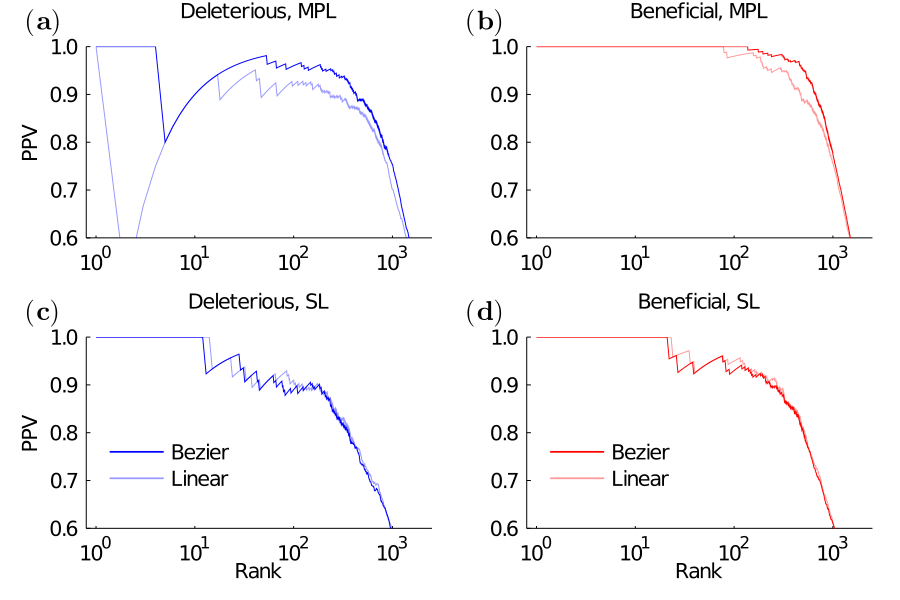

In [19]:
#---- Make PPV figures for MPL -----#
n_DT = 5
Plots.plot(TPR_B_D_set[n_DT][1:2000], color="blue", label=:false)
p1 = Plots.plot!(TPR_L_D_set[n_DT][1:2000], color="blue", label=:false,alpha=0.4, 
                title=@sprintf("Deleterious, MPL"),
                ylabel="PPV")

Plots.plot(TPR_B_B_set[n_DT][1:2000], color="red", label=:false)
p2 = Plots.plot!(TPR_L_B_set[n_DT][1:2000], color="red", label=:false , alpha=0.4,
                title=@sprintf("Beneficial, MPL"))

p1_tot = Plots.plot(p1,p2,layout=(1,2), size=(900, 300),
            fontsize=12,
            labelfontsize=14,
            tickfontsize=14,
            foreground_color_legend = nothing,
            legendfontsize=14,
            legend=:bottomleft,
            xticklength=11,
            margin=5mm,
            grid=false,
            ylim=(0.6,1),
            xaxis=:log);

#---- Make figures for SL -----#
Plots.plot(TPR_B_D_set_SL[n_DT][1:2000], color="blue", label="Bezier")
p1 = Plots.plot!(TPR_L_D_set_SL[n_DT][1:2000], color="blue", label="Linear", alpha=0.4,
                title=@sprintf("Deleterious, SL"),
                xlabel="Rank", ylabel="PPV")



Plots.plot(TPR_B_B_set_SL[n_DT][1:2000], color="red", label="Bezier")
p2 = Plots.plot!(TPR_L_B_set_SL[n_DT][1:2000], color="red", label="Linear",alpha=0.4,
                title=@sprintf("Beneficial, SL"),
                xlabel="Rank")

#---- Combine MPL and SL figures -----#
p2_tot = Plots.plot(p1,p2,layout=(1,2), size=(900, 300),
            fontsize=12,
            labelfontsize=14,
            tickfontsize=14,
            foreground_color_legend = nothing,
            legendfontsize=14,
            #legend=:bottomleft,
            leg =(0.25, 0.4),
            margin=5mm,
            grid=false,
            ylim=(0.6,1),
            xaxis=:log);


Plots.plot(p1_tot,p2_tot,layout=(2,1), size=(figure_width, 600))
annotate!(0.2, 1.05, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(0.2, 1.05, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2)
annotate!(0.2, 1.05, text(L"\mathbf{(c)}", :left, myfontsize+2), subplot=3)
annotate!(0.2, 1.05, text(L"\mathbf{(d)}", :left, myfontsize+2), subplot=4)
#Plots.savefig("../fig/WF/PPV_MPL_SL.pdf")


### Regularization dependency on prediction accuracy

In [20]:
###------ Make PPV curves ------###
n_DT = 5 # for Dt=75, chose n_Dt = 5

TPR_B_gamma_B_set, TPR_B_gamma_D_set = [], []
TPR_L_gamma_B_set, TPR_L_gamma_D_set = [], []
TPR_naive_gamma_B_set, TPR_naive_gamma_D_set = [], []

for n_gamma in 1:n_gamma_max
    (TPR_B_B_DT, TPR_B_D_DT) = get_TPR_curve_bene(vec(selections_B[n_DT,:, n_gamma, indices_B]), vec(selections_B[n_DT,:, n_gamma, indices_N]), vec(selections_B[n_DT,:, n_gamma, indices_D]))
    (TPR_L_B_DT, TPR_L_D_DT) = get_TPR_curve_bene(vec(selections_L[n_DT,:, n_gamma, indices_B]), vec(selections_L[n_DT,:, n_gamma, indices_N]), vec(selections_L[n_DT,:, n_gamma, indices_D]))
    (TPR_naive_B_DT, TPR_naive_D_DT) = get_TPR_curve_bene(vec(selections_naive[n_DT,:, n_gamma, indices_B]), vec(selections_naive[n_DT,:, n_gamma, indices_N]), vec(selections_naive[n_DT,:, n_gamma, indices_D]))

    TPR_B_gamma_B_set = push!(TPR_B_gamma_B_set, TPR_B_B_DT)
    TPR_B_gamma_D_set = push!(TPR_B_gamma_D_set, TPR_B_D_DT)
    
    TPR_L_gamma_B_set = push!(TPR_L_gamma_B_set, TPR_L_B_DT)
    TPR_L_gamma_D_set = push!(TPR_L_gamma_D_set, TPR_L_D_DT)
    
    TPR_naive_gamma_B_set = push!(TPR_naive_gamma_B_set, TPR_naive_B_DT)
    TPR_naive_gamma_D_set = push!(TPR_naive_gamma_D_set, TPR_naive_D_DT)
end


In [21]:
###----- Make multiple PPV curve plots for different regularization values ---#
plot_sets_B = []
plot_sets_D = []
for n_gamma in 1:n_gamma_max
    gamma = gamma_set[n_gamma]
    if(n_gamma==2)
        Plots.plot(TPR_B_gamma_B_set[n_gamma][1:2000], color="orange", label="Bezier")
        Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:2000], color="gray", label="Linear")
        p1 = Plots.plot!(TPR_naive_gamma_B_set[n_gamma][1:2000], color="brown", label="Naive", alpha=0.4,
                        xlabel="", ylabel="PPV", 
                        #legend=:topleft,
                        leg =(0.35, 0.5),
                        legendfontsize=13,
                        title=@sprintf("Beneficial, γ=%.1e",gamma), xaxis=:log)
        Plots.plot(TPR_B_gamma_D_set[n_gamma][1:2000], color="orange", label="Bezier")
        Plots.plot!(TPR_L_gamma_D_set[n_gamma][1:2000], color="gray", label="Linear")
        p2 = Plots.plot!(TPR_naive_gamma_D_set[n_gamma][1:2000], color="brown", label="Naive", alpha=0.4,
                        xlabel="", legend=false,
                        title=@sprintf("Deleterious, γ=%.1e",gamma), xaxis=:log)
    end
    
    if(n_gamma!=n_gamma_max && n_gamma !=2)
        Plots.plot(TPR_B_gamma_B_set[n_gamma][1:2000], color="orange")
        Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:2000], color="gray")
        p1 = Plots.plot!(TPR_naive_gamma_B_set[n_gamma][1:2000], color="brown", alpha=0.4,
                        xlabel="", ylabel="PPV", 
                        legend=:false,legendfontsize=13,
                        title=@sprintf("Beneficial, γ=%.1e",gamma), xaxis=:log)
        Plots.plot(TPR_B_gamma_D_set[n_gamma][1:2000], color="orange")
        Plots.plot!(TPR_L_gamma_D_set[n_gamma][1:2000], color="gray")
        p2 = Plots.plot!(TPR_naive_gamma_D_set[n_gamma][1:2000], color="brown", alpha=0.4,
                        xlabel="", legend=:false,
                        title=@sprintf("Deleterious, γ=%.1e",gamma), xaxis=:log)
    end
    if(n_gamma==n_gamma_max-1)
        Plots.plot(TPR_B_gamma_B_set[n_gamma][1:2000], color="orange")
        Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:2000], color="gray")
        p1 = Plots.plot!(TPR_naive_gamma_B_set[n_gamma][1:2000], color="brown", alpha=0.4, 
                        xlabel="Rank", ylabel="PPV", legend=:false,
                        title=@sprintf("Beneficial, γ=%.1e",gamma), xaxis=:log)
        Plots.plot(TPR_B_gamma_D_set[n_gamma][1:2000], color="orange", label="Bezier")
        Plots.plot!(TPR_L_gamma_D_set[n_gamma][1:2000], color="gray", label="Linear")
        p2 = Plots.plot!(TPR_naive_gamma_D_set[n_gamma][1:2000], color="brown", label="Naive", alpha=0.4, 
                        xlabel="Rank", legend=:false,
                        title=@sprintf("Deleterious, γ=%.1e",gamma), xaxis=:log)
    end
    plot_sets_B = push!(plot_sets_B, p1)
    plot_sets_D = push!(plot_sets_D, p2)
end
   

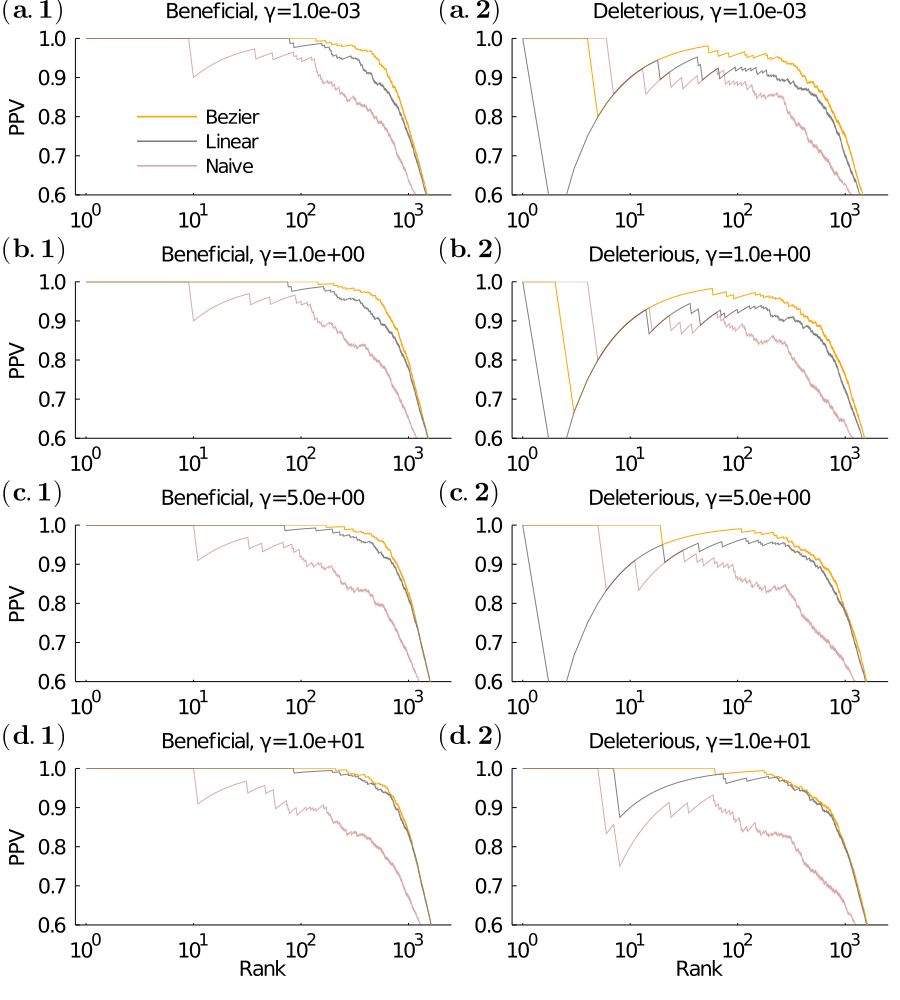

In [22]:
Plots.plot(
        plot_sets_B[2], plot_sets_D[2],
        plot_sets_B[5], plot_sets_D[5],
        plot_sets_B[7], plot_sets_D[7],
        plot_sets_B[8], plot_sets_D[8],
            fontsize=14,
            tickfontsize=14,
            labelfontsize=14,
            foreground_color_legend = nothing,
            grid=:false,
            ylim=(0.6, 1),
            layout=(4,2), size=(figure_width, 4*250) )

annotate!(0.17, 1.07, text(L"\mathbf{(a.1)}", :left, myfontsize+2), subplot=1)
annotate!(0.17, 1.07, text(L"\mathbf{(a.2)}", :left, myfontsize+2), subplot=2)
annotate!(0.17, 1.08, text(L"\mathbf{(b.1)}", :left, myfontsize+2), subplot=3)
annotate!(0.17, 1.08, text(L"\mathbf{(b.2)}", :left, myfontsize+2), subplot=4)
annotate!(0.17, 1.08, text(L"\mathbf{(c.1)}", :left, myfontsize+2), subplot=5)
annotate!(0.17, 1.08, text(L"\mathbf{(c.2)}", :left, myfontsize+2), subplot=6)
annotate!(0.17, 1.08, text(L"\mathbf{(d.1)}", :left, myfontsize+2), subplot=7)
annotate!(0.17, 1.08, text(L"\mathbf{(d.2)}", :left, myfontsize+2), subplot=8)

#Plots.savefig("../fig/WF/regularization_dependency_Nsub1000.pdf")

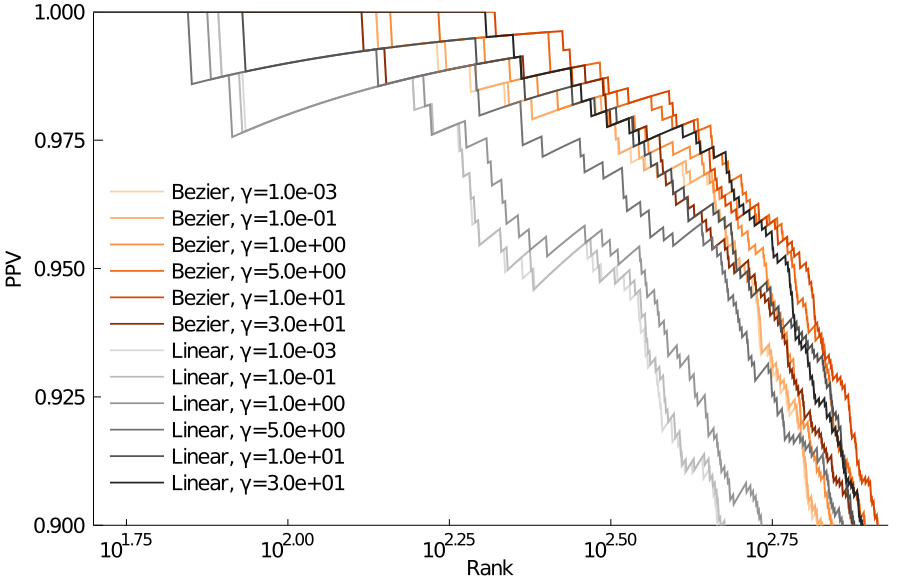

In [23]:
###----- Make PPV curves depending on several regulariation values (get closer) ----#
mycolor_L = cgrad(:Greys_7)
mycolor_B = cgrad(:Oranges_7)
n_gamma = 2
Plots.plot(TPR_B_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Bezier, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_B[2])
n_gamma = 3
Plots.plot!(TPR_B_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Bezier, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_B[3]) 
n_gamma = 5
Plots.plot!(TPR_B_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Bezier, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_B[4])
n_gamma = 7
Plots.plot!(TPR_B_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Bezier, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_B[5])
n_gamma = 8
Plots.plot!(TPR_B_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Bezier, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_B[6])
n_gamma = 9
p1 = Plots.plot!(TPR_B_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Bezier, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_B[7], legend=:bottomleft)


n_gamma = 2
Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Linear, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_L[2] )
n_gamma = 3
Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Linear, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_L[3]) 
n_gamma = 5
Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Linear, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_L[4])
n_gamma = 7
Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Linear, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_L[5])
n_gamma = 8
Plots.plot!(TPR_L_gamma_B_set[n_gamma][1:1500],  label=@sprintf("Linear, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_L[6])
n_gamma = 9
p2 = Plots.plot!(TPR_L_gamma_B_set[n_gamma],  label=@sprintf("Linear, γ=%.1e",gamma = gamma_set[n_gamma]), c=mycolor_L[7], legend=:bottomleft)
Plots.plot(p2,layout=(1,1), size=(figure_width, 580), 
    xaxis=:log, linewidth=2, ylim=(0.9,1), xlim=(50,850), 
            fontsize=14,
            #lgend=:left,
            leg =(0.1, 0.65),
            legendfontsize=14,
            tickfontsize=14,
            labelfontsize=14,
            foreground_color_legend = nothing,
            ylabel="PPV",
            xlabel="Rank",
            grid=:false
)
#Plots.savefig("../fig/WF/compare_Bezier_linear_PPV.pdf")

### Sampling interval dependendency on prediction accuracy

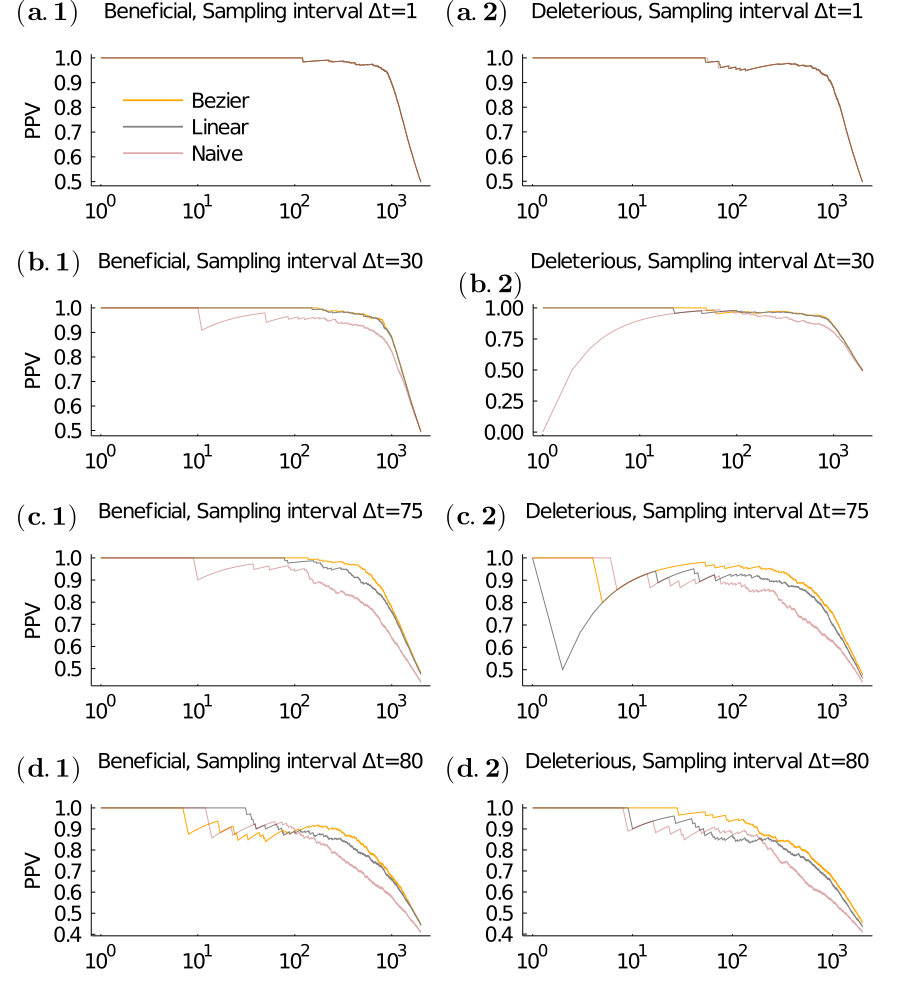

In [24]:
#--- make a summary of all Δt dependent figures ----#

Plot_list = []
for n_DT in 1:size(time_steps,1)

    if(n_DT==1)
            Plots.plot(TPR_B_B_set[n_DT][1:2000], color="orange", label="Bezier")
            Plots.plot!(TPR_L_B_set[n_DT][1:2000], color="gray", label="Linear")
            p1 = Plots.plot!(TPR_naive_B_set[n_DT][1:2000], color="brown", label="Naive",
                    title=@sprintf("Beneficial, Sampling interval Δt=%d",time_steps[n_DT]),alpha=0.4,
                    ylabel="PPV", leg =(0.3, 0.65))
    end
    if(n_DT!=1 && n_DT < 11)
        Plots.plot(TPR_B_B_set[n_DT][1:2000], color="orange", label=:false)
        Plots.plot!(TPR_L_B_set[n_DT][1:2000], color="gray", label=:false)
        p1 = Plots.plot!(TPR_naive_B_set[n_DT][1:2000], color="brown", label=:false,
                        title=@sprintf("Beneficial, Sampling interval Δt=%d",time_steps[n_DT]),alpha=0.4,
                        ylabel="PPV")
    end
    if(n_DT<11)
        Plots.plot(TPR_B_D_set[n_DT][1:2000], color="orange", label=:false)
        Plots.plot!(TPR_L_D_set[n_DT][1:2000], color="gray", label=:false)
        p2 = Plots.plot!(TPR_naive_D_set[n_DT][1:2000], color="brown", label=:false,
                        title=@sprintf("Deleterious, Sampling interval Δt=%d",time_steps[n_DT]),alpha=0.4)
    end
    
    if(n_DT==11)
        Plots.plot(TPR_B_D_set[n_DT][1:2000], color="orange", label=:false)
        Plots.plot!(TPR_L_D_set[n_DT][1:2000], color="gray", label=:false)
        p2 = Plots.plot!(TPR_naive_D_set[n_DT][1:2000], color="brown", label=:false, xlabel="Rank",
                        title=@sprintf("Deleterious, Sampling interval Δt=%d",time_steps[n_DT]),alpha=0.4)
    end
    if(n_DT==12)
        Plots.plot(TPR_B_B_set[n_DT][1:2000], color="orange", label=:false)
        Plots.plot!(TPR_L_B_set[n_DT][1:2000], color="gray", label=:false)
        p1 = Plots.plot!(TPR_naive_B_set[n_DT][1:2000], color="brown", label=:false, xlabel="Rank",
                        title=@sprintf("Beneficial, Sampling interval Δt=%d",time_steps[n_DT]),alpha=0.4,
                         ylabel="PPV")
    end
    
    Plot_list = push!(Plot_list, p1)
    Plot_list = push!(Plot_list, p2)
end

    Plots.plot( Plot_list[1 ], Plot_list[2],
                Plot_list[5 ], Plot_list[6],
                Plot_list[9 ], Plot_list[10],
                Plot_list[11], Plot_list[12],
                layout=(4,2),
                size=(figure_width, 4*250),
                fontsize=14,
                margin=5mm,
                labelfontsize=14,
                tickfontsize=14,
                foreground_color_legend = nothing,
                legendfontsize=14,
                xticklength=11,
                grid=false,
                xaxis=:log)
annotate!(0.14, 1.18, text(L"\mathbf{(a.1)}", :left, myfontsize+2), subplot=1)
annotate!(0.14, 1.18, text(L"\mathbf{(a.2)}", :left, myfontsize+2), subplot=2)
annotate!(0.14, 1.18, text(L"\mathbf{(b.1)}", :left, myfontsize+2), subplot=3)
annotate!(0.14, 1.18, text(L"\mathbf{(b.2)}", :left, myfontsize+2), subplot=4)
annotate!(0.14, 1.18, text(L"\mathbf{(c.1)}", :left, myfontsize+2), subplot=5)
annotate!(0.14, 1.18, text(L"\mathbf{(c.2)}", :left, myfontsize+2), subplot=6)
annotate!(0.14, 1.18, text(L"\mathbf{(d.1)}", :left, myfontsize+2), subplot=7)
annotate!(0.14, 1.18, text(L"\mathbf{(d.2)}", :left, myfontsize+2), subplot=8)
#Plots.savefig("../fig/WF/PPV_Bezier_Linear_summary_Nsub1000.pdf")


### Large and small regularization effect on selection coefficient distributions

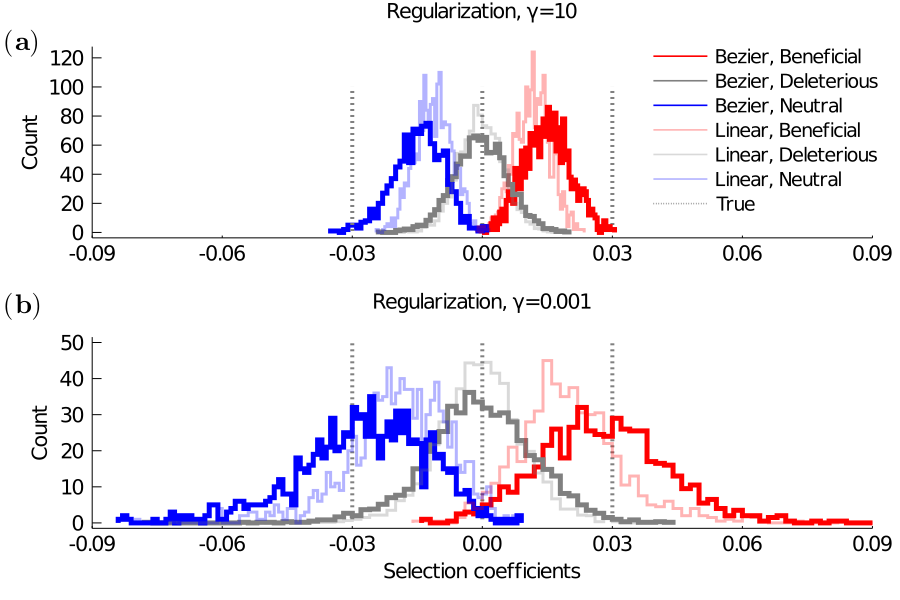

In [25]:
n_DT = 5
n_gamma_small = 2
n_gamma_large = 8;

x_axis2 = collect(1:100) 
Plots.plot(0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false)
Plots.plot!(zeros(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false)

Plots.plot!(vec(selections_B[n_DT,:, n_gamma_large, indices_B]), seriestype=:stephist,linewidth=5, linestyle=:solid, c="red", nbins=60, normalize=true, label="Bezier, Beneficial")
Plots.plot!(vec(selections_B[n_DT,:, n_gamma_large, indices_N]), seriestype=:stephist, linewidth=5, linestyle=:solid, c="gray", nbins=60, normalize=true, label="Bezier, Deleterious")
Plots.plot!(vec(selections_B[n_DT,:, n_gamma_large, indices_D]), seriestype=:stephist, linewidth=5, linestyle=:solid, c="blue", nbins=60, normalize=true, label="Bezier, Neutral")
Plots.plot!(vec(selections_L[n_DT,:, n_gamma_large, indices_B]), seriestype=:stephist, linewidth=3, linealpha=0.3, linestyle=:solid, c="red", nbins=60, normalize=true, label="Linear, Beneficial")
Plots.plot!(vec(selections_L[n_DT,:, n_gamma_large, indices_N]), seriestype=:stephist, linewidth=3, linealpha=0.3,linestyle=:solid, c="gray", nbins=60, normalize=true, label="Linear, Deleterious")
Plots.plot!(vec(selections_L[n_DT,:, n_gamma_large, indices_D]), seriestype=:stephist, linewidth=3, linealpha=0.3,linestyle=:solid, c="blue", nbins=60, normalize=true, label="Linear, Neutral", ylabel="Count", legend=:bottomright, title="Regularization, γ=10")
p1 = Plots.plot!(-0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, 
    linealpha=1, label="True", leg =(0.8, 0.95))

x_axis2 = collect(1:50) 
Plots.plot(0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false)
Plots.plot!(zeros(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false)
Plots.plot!(-0.03*ones(size(x_axis2)), x_axis2, color="gray", line=(:dot,4), linewidth=5, linealpha=1, label=:false)

Plots.plot!(vec(selections_B[n_DT,:, n_gamma_small, indices_B]), seriestype=:stephist,linewidth=5, linestyle=:solid, c="red", nbins=80, normalize=true, label=:false)
Plots.plot!(vec(selections_B[n_DT,:, n_gamma_small, indices_N]), seriestype=:stephist, linewidth=5, linestyle=:solid, c="gray", nbins=80, normalize=true, label=:false)
Plots.plot!(vec(selections_B[n_DT,:, n_gamma_small, indices_D]), seriestype=:stephist, linewidth=5, linestyle=:solid, c="blue", nbins=90, normalize=true, label=:false)

Plots.plot!(vec(selections_L[n_DT,:, n_gamma_small, indices_B]), seriestype=:stephist, linewidth=3, linealpha=0.3, linestyle=:solid, c="red", nbins=80, normalize=true, label=:false)
Plots.plot!(vec(selections_L[n_DT,:, n_gamma_small, indices_N]), seriestype=:stephist, linewidth=3, linealpha=0.3,linestyle=:solid, c="gray", nbins=80, normalize=true, label=:false)
p2 = Plots.plot!(vec(selections_L[n_DT,:, n_gamma_small, indices_D]), seriestype=:stephist, linewidth=3, linealpha=0.3,linestyle=:solid, c="blue", nbins=90, normalize=true, label=:false, ylabel="Count", xlabel="Selection coefficients", legend=:false, title="Regularization, γ=0.001")

Plots.plot(p1,p2,layout=(2,1), size=(figure_width, 600), 
                fontsize=14,
                labelfontsize=14,
                tickfontsize=14,
                xlim=(-0.09,0.09),
                foreground_color_legend = nothing,
                legendfontsize=13,
                #legend=:false,
                margin=5mm,
                grid=false, 
                
)
annotate!(-0.11, 130, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(-0.11, 60, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2)
#Plots.savefig("../fig/WF/selection_histogram_with_large_small_regularization.pdf")

### The minimum eigenvalue distributioins of the integrated covarince matrices 

In [26]:
###---- Read eigenvalu files ----####
eigen_min_L = readdlm("../out/WF/eigenvalues_cov_Lin.dat")
eigen_min_B = readdlm("../out/WF/eigenvalues_cov_Bez.dat")
eigen_min_naive = readdlm("../out/WF/eigenvalues_cov_naive.dat");

###---- Make figures for minimum eigenvalue distribution 
Plot_list = []
mynbins=20
myalpha=0.3
for id_time_steps in 1:n_time_steps
    if(id_time_steps==1)
        Plots.plot(eigen_min_B[id_time_steps, :], seriestype=:stephist , label="Bezier", c="orange")
        Plots.plot!(eigen_min_L[id_time_steps, :], seriestype=:stephist, label="Linear", c="gray")
        p = Plots.plot!(eigen_min_naive[id_time_steps, :], seriestype=:stephist, label="brown", legend=:bottomleft, c="gray", alpha=myalpha, title=@sprintf("Δt=%d", time_steps[id_time_steps]))
    end
    if(id_time_steps!=1 && id_time_steps!=7)
        Plots.plot!(eigen_min_B[id_time_steps, :], seriestype=:stephist, legend=:false, c="orange")
        Plots.plot!(eigen_min_L[id_time_steps, :], seriestype=:stephist, legend=:false, c="gray")
        p = Plots.plot!(eigen_min_naive[id_time_steps, :], seriestype=:stephist, legend=:false, c="brown", 
            linealpha=myalpha, title=@sprintf("Δt=%d", time_steps[id_time_steps]))
    end
        if(id_time_steps == 7)
        Plots.plot(eigen_min_B[id_time_steps, :], seriestype=:stephist, legend=:false, c="orange")
        Plots.plot!(eigen_min_L[id_time_steps, :], seriestype=:stephist, legend=:false, c="gray")
        p = Plots.plot!(eigen_min_naive[id_time_steps, :], seriestype=:stephist, legend=:false, c="brown", 
        xlabel="minimum eigenvalue", linealpha=myalpha, title=@sprintf("Δt=%d", time_steps[id_time_steps]))
    end
    Plot_list = push!(Plot_list, p)        
end

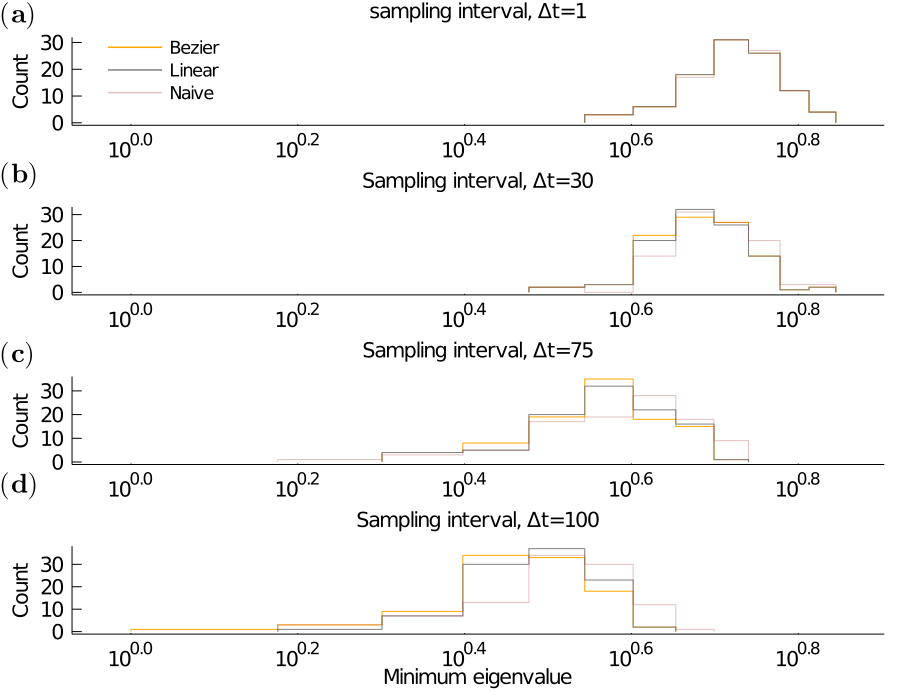

In [27]:
id_time_steps = 1
Plots.plot(eigen_min_B[id_time_steps, :], seriestype=:stephist , label="Bezier", c="orange")
Plots.plot!(eigen_min_L[id_time_steps, :], seriestype=:stephist, label="Linear", c="gray")
p1 = Plots.plot!(eigen_min_naive[id_time_steps, :], seriestype=:stephist, label="Naive", legend=:left, c="brown", alpha=myalpha, title=@sprintf("sampling interval, Δt=%d", time_steps[id_time_steps]))

id_time_steps = 3
Plots.plot(eigen_min_B[id_time_steps, :], seriestype=:stephist, legend=:false, c="orange")
Plots.plot!(eigen_min_L[id_time_steps, :], seriestype=:stephist, legend=:false, c="gray")
p2 = Plots.plot!(eigen_min_naive[id_time_steps, :], seriestype=:stephist, legend=:false, c="brown", 
    linealpha=myalpha, title=@sprintf("Sampling interval, Δt=%d", time_steps[id_time_steps]))

id_time_steps = 5
Plots.plot(eigen_min_B[id_time_steps, :], seriestype=:stephist, legend=:false, c="orange")
Plots.plot!(eigen_min_L[id_time_steps, :], seriestype=:stephist, legend=:false, c="gray")
p3 = Plots.plot!(eigen_min_naive[id_time_steps, :], seriestype=:stephist, legend=:false, c="brown", 
    linealpha=myalpha, title=@sprintf("Sampling interval, Δt=%d", time_steps[id_time_steps]))

id_time_steps = 7
Plots.plot(eigen_min_B[id_time_steps, :], seriestype=:stephist, legend=:false, c="orange")
Plots.plot!(eigen_min_L[id_time_steps, :], seriestype=:stephist, legend=:false, c="gray")
p4 = Plots.plot!(eigen_min_naive[id_time_steps, :], seriestype=:stephist, legend=:false, c="brown", 
    linealpha=myalpha, title=@sprintf("Sampling interval, Δt=%d", time_steps[id_time_steps]), xlabel="Minimum eigenvalue");

Plots.plot(p1,p2,p3,p4,
            layout=(4,1),
            size=(figure_width, 700),
            xaxis=:log,
            xlim=(0.85,8),
            fontsize=14,
            labelfontsize=14,
            tickfontsize=14,
            ticklength=14,
            legendfontsize=12,
            foreground_color_legend = nothing,
            grid=false,
            margin=2mm,
            ylabel="Count"
)

annotate!(0.7, 40, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(0.7, 45, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2)
annotate!(0.7, 45, text(L"\mathbf{(c)}", :left, myfontsize+2), subplot=3)
annotate!(0.7, 65, text(L"\mathbf{(d)}", :left, myfontsize+2), subplot=4)
#Plots.savefig("../fig/WF/minimum_eigen_values.pdf")

# HIV1 Env accross 13 individuals. 

In [28]:
###---- Read precomputed selection coefficients ---#
name_keys = ["700010470", "700010077", "700010058", "700010040", "700010607", 
          "706010164", "705010198", "705010185", "705010162", "704010042", 
          "703010256", "703010159", "703010131"];
n_polys = ["3", "5"];

selections_L_set = []
selections_B_set = []


for ID_seq in 1:size(name_keys,1)
    n_poly_max = 2
    if(ID_seq==size(name_keys,1))
        n_poly_max =1
    end
    for ID_poly in 1:n_poly_max

        fname_in = "../out/HIV/"*name_keys[ID_seq]*"-"*string(n_polys[ID_poly])*"_selections.dat"
        selections_set = readdlm(fname_in)
        
        selections_L_set = push!(selections_L_set, copy(selections_set[:,1]))
        selections_B_set = push!(selections_B_set, copy(selections_set[:,2]))
    end
end

In [29]:
###---- Change the format of the data ---#
selections_L_vec = []
selections_B_vec = []
n_files = size(selections_L_set,1)
for n in 1:n_files
    if(n==1)
        selections_L_vec = copy(selections_L_set[n])
        selections_B_vec = copy(selections_B_set[n])
    end
    if(n>1)
        selections_L_vec = copy(vcat(selections_L_vec, selections_L_set[n]))
        selections_B_vec = copy(vcat(selections_B_vec, selections_B_set[n]))
    end
end;
        

In [30]:
##------- Make a figure for linear MPL and Bezier MPL comparison ----#
Plots.plot(collect(-0.05:0.01:0.05), collect(-0.05:0.01:0.05), legend=:false, c="black")
p1 = Plots.scatter!(selections_L_vec, selections_B_vec, legend=:false, markeralpha=0.1, markerstrokewidth=0, c="blue")

mycorr = Statistics.cor(selections_L_vec, selections_B_vec)
corr_string = @sprintf("%.2f", mycorr)
@show corr_string
#annotate_string = L"$\mathrm{Pearson's  }\ r = 0.82 $"
annotate_string = "Pearson's r = $corr_string "
#annotate_string = Markdown.parse( "\$  Pearson's ~ r = $corr_string \$")  # this does depend on environment
annotate!(0.023, 0.02, text(annotate_string, :left, myfontsize+2, color="black"), subplot=1)


Plots.plot(p1, 
    layout=(1,1), size=(figure_width, figure_width-200),
    fontsize=14,
    labelfontsize=14,
    #title="Comparison of selection coefficients \n between linear and Bezier interpolation",
    tickfontsize=14,
    foreground_color_legend = nothing,
    legendfontsize=14,
    margin=5mm,
    xlabel="Selection coefficients \n using MPL with Linear interpolation",
    ylabel="Selection coefficients \n using MPL with Bezier interpolation",
    markersize=3,
    xticklength=14,
    grid=false)
#
#Plots.savefig("../fig/HIV/correlation_Bezier_linear.pdf")


corr_string = "0.93"


# Ornstein-Uhlenbeck process

## Fig.6 Typical trajectory of OU process

In [31]:
###---- Read effective energy profile ---#
L = 50
x_trajectory_raw = readdlm("../out/OU/trajectory.dat")
#n_t_count_max = 
n_t_count_max = Int(x_trajectory_raw[end, 2])
n_ensemble_temp = Int(x_trajectory_raw[end, 1])
x_ensembles_temp = zeros(n_ensemble_temp, n_t_count_max, L);
for k in 1:size(x_trajectory_raw,1)
     raw_line = x_trajectory_raw[k,:]
    n, n_t = Int(raw_line[1]),  Int(raw_line[2])
    #@show k, 
    for i in 1:L
        v = raw_line[3+i]
        x_ensembles_temp[n, n_t, i] = v
    end
end

t_ensembles_temp = readdlm("../out/OU/tiems.dat");
erg_evolution_avg = readdlm("../out/OU/energy.dat")[:,end];

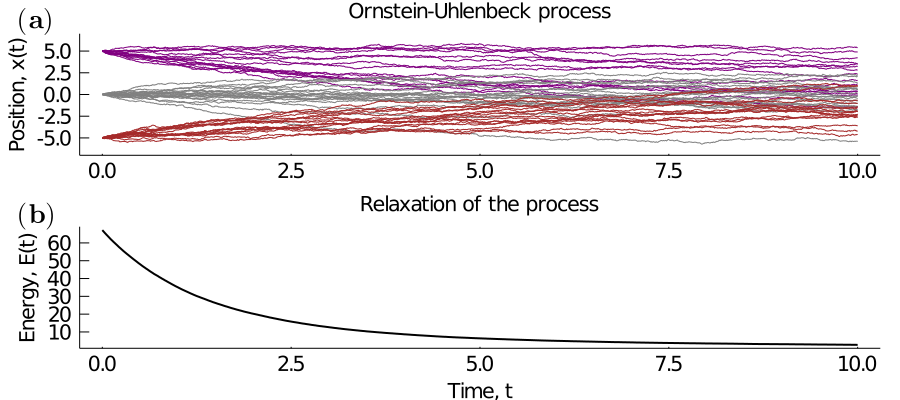

In [32]:
###--- Make figures for the OU process and its energy profile ----#
n,i=2,1
p1 = Plots.plot(t_ensembles_temp  , erg_evolution_avg, linewidth=2, label=false,c="black", yaxis="Energy, E(t)", xlabel="Time, t", title="Relaxation of the process")

Plots.plot(t_ensembles_temp , x_ensembles_temp[n, 1:n_t_count_max, 1], legend=:false, c="purple")
for i in 2:L
    if(i<=(Int(floor(0.3*L))))
        color_type = "purple"
    end
    if( i>(Int(floor(0.3*L))) && i<(Int(floor(0.7*L))))
        color_type = "gray"
    end
    if(i>=(Int(floor(0.7*L))))
        color_type = "brown"
    end
    
    Plots.plot!(t_ensembles_temp, x_ensembles_temp[n, 1:n_t_count_max, i], legend=:false, c=color_type)
end

p2 = Plots.plot!(t_ensembles_temp, x_ensembles_temp[n, 1:n_t_count_max, L], legend=:false, c="brown", ylabel="Position, x(t)", ylim=(-7,7), title="Ornstein-Uhlenbeck process")

Plots.plot(p2, p1 ,
    layout=(2,1), size=(figure_width, 400),
    margin=3mm,
    fontsize=14,
    labelfontsize=14,
    tickfontsize=14,
    foreground_color_legend = nothing,
    legendfontsize=14,
    xticklength=14,
    grid=false)

annotate!(-1.1, 8.4, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(-1.1, 75, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2)


#Plots.savefig("../fig/OU/energy_trajectory_OU.pdf")

## Fig7.Prediction accuracy

### Fig.7.b Sampling interval dependency on the estiation accuracy 

In [33]:
### --- Read statistics for sampling interval dependency ---###

corr_Lin = readdlm("../out/OU/sampling_interval_dependency_Lin_corr.dat")
corr_Bez = readdlm("../out/OU/sampling_interval_dependency_Bez_corr.dat") 
slope_Lin = readdlm("../out/OU/sampling_interval_dependency_Lin_slope.dat")
slope_Bez = readdlm("../out/OU/sampling_interval_dependency_Bez_slope.dat")
linreg_Lin = readdlm("../out/OU/linreg-parameters_Lin.dat")
linreg_Bez = readdlm("../out/OU/linreg-parameters_Bez.dat");
times_observed = corr_Lin[:, 1];;

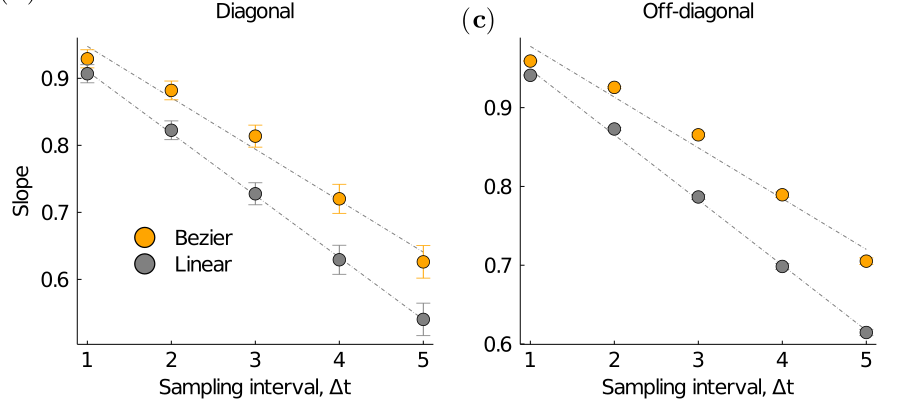

In [34]:
###----- Make sampling interval dependency plot ----###
dt = 1e-3
Plots.plot(times_observed*dt,  linreg_Bez[2, 1]*times_observed .+linreg_Bez[1, 1], label=:false, c="gray", linestyle=:dashdot)
Plots.scatter!(times_observed*dt, marker=:circle, slope_Bez[:,2], line=:false, yerror=slope_Bez[:,3], label="Bezier", c="orange", title="Diagonal", ylabel="Slope")

Plots.plot!(times_observed*dt,  linreg_Lin[2, 1]*times_observed .+linreg_Lin[1, 1], label=:false, c="gray", linestyle=:dashdot)
p1 = Plots.scatter!(times_observed*dt, marker=:circle, slope_Lin[:,2], line=:false, yerror=slope_Bez[:,3], label="Linear", c="gray", legend=:bottomleft, xlabel="Sampling interval, Δt")

Plots.plot(times_observed*dt,  linreg_Bez[2, 2]*times_observed .+linreg_Bez[1, 2], label=:false, c="gray", linestyle=:dashdot)
Plots.scatter!(times_observed*dt, marker=:circle, slope_Bez[:,4], line=:false, xlabel="Sampling interval, Δt",  yerror=slope_Bez[:,5], c="orange", title="Off-diagonal")

Plots.plot!(times_observed*dt,  linreg_Lin[2, 2]*times_observed .+linreg_Lin[1, 2], label=:false, c="gray", linestyle=:dashdot)
p2 = Plots.scatter!(times_observed*dt, marker=:circle, slope_Lin[:,4], line=:false, yerror=slope_Lin[:,5], label="Linear", c="gray", legend=:false)


Plots.plot(p1,p2,layout=(1,2), size=(figure_width,400),
        #title="Δt= "*string(t_observe)*", energy",  
        fontsize=14,
        labelfontsize=14,
        tickfontsize=14,
        foreground_color_legend = nothing,
        markersize=7,
        legendfontsize=14,
        margin=4mm,
        #linewidth=2,
        xticklength=14,
        grid=false)
annotate!(-0.03, 1.03, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=1)
annotate!(0.2, 1.01, text(L"\mathbf{(c)}", :left, myfontsize+2), subplot=2)

#Plots.savefig("../fig/OU/Slope_Dt-dependency.pdf")

### Fig.7.a Compare estimated interaction parameters and true interaction parameters 

In [35]:
###---- Read estimated interaction parameters for various methods ----###
fname_in = "../out/OU/coupling_true.dat"
J = read_coupling(fname_in);
fname_in = "../out/OU/coupling_inverse-cov.dat"
J_est_eq = read_coupling(fname_in);
fname_in = "../out/OU/coupling_naive-MPL.dat"
J_est = read_coupling(fname_in);
fname_in = "../out/OU/coupling_linear-MPL.dat"
J_est_Lin = read_coupling(fname_in);
fname_in = "../out/OU/coupling_Bezier-MPL.dat"
J_est_Bez = read_coupling(fname_in);
(J_diag, J_offdiag) = get_diag_offdiag(J)
(J_est_eq_diag, J_est_eq_offdiag) = get_diag_offdiag(J_est_eq)
(J_est_diag, J_est_offdiag) = get_diag_offdiag(J_est)
(J_Lin_diag, J_Lin_offdiag) = get_diag_offdiag(J_est_Lin)
(J_Bez_diag, J_Bez_offdiag) = get_diag_offdiag(J_est_Bez);

In [36]:
###---- Preprocess of the estimated cupling parameters ----###
Jvec_true = [J_diag; vec(J_offdiag)]
Jvec_naive = [J_est_diag; vec(J_est_offdiag)]
Jvec_Lin = [J_Lin_diag; vec(J_Lin_offdiag)]
Jvec_Bez = [ J_Bez_diag; vec(J_Bez_offdiag)];

x_mean = mean(J_diag)
xwidth = 0.05#maximum(J_diag)-minimum(J_diag)

xmin_temp = x_mean - xwidth/2
xmax_temp = x_mean + xwidth/2
y_mean = mean(J_est_eq_diag)

ymin_temp = y_mean - xwidth/2 # y_mean - (max(true)-min(true))/2
ymax_temp = y_mean + xwidth/2 # y_mean + (max(true)-min(true))/2

-0.04625478854333511

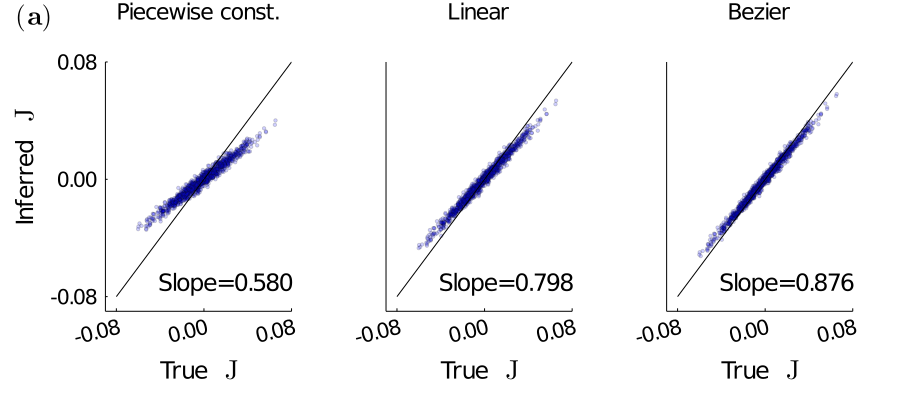

In [37]:
lim_min = -0.09
lim_max = 0.08
diagonal_plot = collect(-lim_max:0.01:lim_max)

scatter(vec(J_offdiag), vec(J_est_offdiag), c="blue", xlabel=" ", title="Piecewise const.", markeralpha=0.1 , ylim=(lim_min,lim_max), xlim=(lim_min,lim_max))
p1 = Plots.plot!(diagonal_plot, diagonal_plot, legend=:false, color="black", yticks=[-0.08, 0, 0.08])
annotate_string1 = get_corslope_label_v2(vec(J_offdiag), vec(J_est_offdiag))
annotate!(0.02, -0.079, text(annotate_string1, myfontsize))
annotate!(-0.164,0.04, text(L"$\mathrm{J}$", :left, myfontsize+2, rotation=90))
annotate!(-0.164,-0.03, text("Inferred", :left, myfontsize, rotation=90))

scatter(vec(J_offdiag), vec(J_Lin_offdiag) ,c="blue", title="Linear", markeralpha=0.1 , ylim=(lim_min,lim_max), xlim=(lim_min,lim_max))
p2 = Plots.plot!(diagonal_plot, diagonal_plot, legend=:false, color="black", yticks=:none)
annotate_string2 = get_corslope_label_v2(vec(J_offdiag), vec(J_Lin_offdiag))
annotate!(0.02, -0.079, text(annotate_string2, myfontsize))

scatter(vec(J_offdiag), vec(J_Bez_offdiag),c="blue", title="Bezier", markeralpha=0.1 , ylim=(lim_min,lim_max), xlim=(lim_min,lim_max))
p3 = Plots.plot!(diagonal_plot, diagonal_plot, legend=:false, color="black", yticks=:none)
annotate_string3 = get_corslope_label_v2(vec(J_offdiag), vec(J_Bez_offdiag))
annotate!(0.02, -0.079, text(annotate_string3, myfontsize))
Plots.plot(p1,p2,p3,layout=(1,3), size=(figure_width,300))
annotate!(0.02, -0.13, text(L"$\mathrm{J}$", :left, myfontsize+2))
annotate!(-0.04, -0.13, text("True ", :left, myfontsize))

p1_1 = Plots.plot(p1,p2,p3,
    layout=(1,3), size=(figure_width, 400),
    fontsize=14,
    xrotation=14,
    labelfontsize=14,
    titlefontsize=15,
    markersize=2,
    legend=false,
    tickfontsize=14,
    foreground_color_legend = nothing,
    xticks=[-0.08,0, 0.08],
    #ymargin=1mm,
    margin=10mm,
    xticklength=20,
    grid=false)

annotate!(-0.17, 0.11, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
#Plots.savefig("../fig/OU/offdiag_scatter.pdf")



## Supplementary figure for Ornstein-Uhlenbeck process 

### Supplementary figure: time interval dependency on regression slope. 

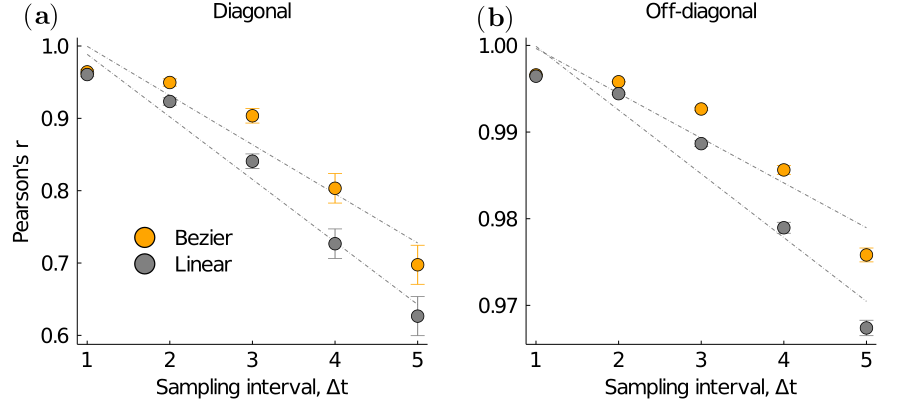

In [38]:
###---- Make figure ----#
Plots.plot(times_observed*dt,  linreg_Bez[2, 3]*times_observed .+linreg_Bez[1, 3], label=:false, c="gray", linestyle=:dashdot)
Plots.scatter!(times_observed*dt, marker=:circle, corr_Bez[:,2], line=:false, yerror=corr_Bez[:,3], label="Bezier", c="orange", title="Diagonal")

Plots.plot!(times_observed*dt,  linreg_Lin[2, 3]*times_observed .+linreg_Lin[1, 3], label=:false, c="gray", linestyle=:dashdot, ylabel="Pearson's r", xlabel="Sampling interval, Δt", legend=:bottomleft)
p1 = Plots.scatter!(times_observed*dt, marker=:circle, corr_Lin[:,2], line=:false, yerror=corr_Bez[:,3], label="Linear", c="gray")


Plots.plot(times_observed*dt,  linreg_Bez[2, 4]*times_observed .+linreg_Bez[1, 4], label=:false, c="gray", linestyle=:dashdot)
Plots.scatter!(times_observed*dt, marker=:circle, corr_Bez[:,4], line=:false, xlabel="Sampling interval, Δt",  yerror=corr_Bez[:,5], label="Bezier", c="orange", title="Off-diagonal")

Plots.plot!(times_observed*dt,  linreg_Lin[2, 4]*times_observed .+linreg_Lin[1, 4], label=:false, c="gray", linestyle=:dashdot, legend=:false)
p2 = Plots.scatter!(times_observed*dt, marker=:circle, corr_Lin[:,4], line=:false, yerror=corr_Lin[:,5], label="Linear", c="gray")



Plots.plot(p1,p2,layout=(1,2), size=(figure_width,400),
        #title="Δt= "*string(t_observe)*", energy",  
        fontsize=14,
        labelfontsize=14,
        tickfontsize=14,
        foreground_color_legend = nothing,
        legendfontsize=14,
        margin=4mm,
        markersize=7,
        xticklength=14,
        grid=false)

#annotate!(0.45, 0.98, text("(a)", :left, myfontsize), subplot=1)
annotate!(0.25, 1.04, text(L"\mathbf{(a)}", :left, myfontsize+2), subplot=1)
annotate!(0.3, 1.003, text(L"\mathbf{(b)}", :left, myfontsize+2), subplot=2)

#Plots.savefig("../fig/OU/Pearson_Dt-dependency.pdf")

### Camparison between true interaction parameters and estimated interaction parameters


In [39]:
##---- Make figures including regression slope and Pearson's correlation coefficient ----#
xmin_d, xmax_d = -0.15, -0.1
xmin_od, xmax_od = -0.08, 0.08
xlim_d = 0.15
xlim_od = 0.08

diagonal_plot = collect(-xlim_d:0.01:xlim_d)
offdiagonal_plot = collect(-xlim_od:0.01:xlim_od)

x_mean = mean(J_diag)
xwidth = 0.05 #maximum(J_diag)-minimum(J_diag)

xmin_temp = x_mean - xwidth/2
xmax_temp = x_mean + xwidth/2
y_mean = mean(J_est_eq_diag)

ymin_temp = y_mean - xwidth/2 # y_mean - (max(true)-min(true))/2
ymax_temp = y_mean + xwidth/2 # y_mean + (max(true)-min(true))/2
scatter(J_diag, J_est_eq_diag, ylabel="Inverse cov.",c="blue", title="Diagonal", markeralpha=0.4, ylim=(ymin_temp, ymax_temp), xlim=(xmin_temp, xmax_temp))
diagonal_plot=(-0.15:0.01:-0.06)
p1 = Plots.plot!(diagonal_plot, diagonal_plot, legend=:false, c="black", xlim=(-0.15, -0.06), ylim=(-0.15, -0.06))
annotate_string2 = get_corslope_label(J_diag, J_est_eq_diag)
annotate!(-0.09, -0.135, annotate_string2)

scatter(vec(J_offdiag), vec(J_est_eq_offdiag), ylabel="Inverse cov",c="blue", title="Off-diagonal", markeralpha=0.1, xlim=(xmin_od,xmax_od), ylim=(xmin_od,xmax_od))
p2 = Plots.plot!(offdiagonal_plot, offdiagonal_plot, legend=:false, c="black")
annotate_string4 = get_corslope_label(vec(J_offdiag), vec(J_est_eq_offdiag))
annotate!(0.01, -0.07, annotate_string4)

y_mean = mean(J_est_diag)
ymin_temp = y_mean - xwidth/2 # y_mean - (max(true)-min(true))/2
ymax_temp = y_mean + xwidth/2 # y_mean + (max(true)-min(true))/2
scatter(J_diag, J_est_diag, ylabel="Piecewise constant", c="blue", markeralpha=0.4, ylim=(ymin_temp, ymax_temp), xlim=(xmin_temp, xmax_temp))

d_lim_min, d_lim_max = -0.15, -0.08
diagonal_plot=(d_lim_min:0.01:d_lim_max)
p3 = Plots.plot!(diagonal_plot, diagonal_plot, legend=:false, c="black", xlim=(d_lim_min, d_lim_max), ylim=(d_lim_min, d_lim_max))
annotate_string1 = get_corslope_label(J_diag, J_est_diag)
annotate!(-0.1, -0.145, annotate_string1)

scatter(vec(J_offdiag), vec(J_est_offdiag), xlabel="True", ylabel="Picewise constant",c="blue", markeralpha=0.1, xlim=(xmin_od,xmax_od), ylim=(xmin_od,xmax_od))
p4 = Plots.plot!(offdiagonal_plot, offdiagonal_plot, legend=:false, c="black")
annotate_string3 = get_corslope_label(vec(J_offdiag), vec(J_est_offdiag))
annotate!(0.01, -0.07, annotate_string3)

scatter(J_diag, J_Lin_diag, ylabel="Linear",c="blue", markeralpha=0.4, xlim=(xmin_d,xmax_d), ylim=(xmin_d,xmax_d))
d_lim_min, d_lim_max = -0.15, -0.08
diagonal_plot=(d_lim_min:0.01:d_lim_max)
p5 = Plots.plot!(diagonal_plot, diagonal_plot, legend=:false, c="black", xlim=(d_lim_min, d_lim_max), ylim=(d_lim_min, d_lim_max))
annotate_string2 = get_corslope_label(J_diag, J_Lin_diag)
annotate!(-0.1, -0.14, annotate_string2)

scatter(vec(J_offdiag), vec(J_Lin_offdiag), ylabel="Linear",c="blue", markeralpha=0.1, xlim=(xmin_od,xmax_od), ylim=(xmin_od,xmax_od))
p6 = Plots.plot!(offdiagonal_plot, offdiagonal_plot, legend=:false, c="black")
annotate_string4 = get_corslope_label(vec(J_offdiag), vec(J_Lin_offdiag))
annotate!(0.01, -0.07, annotate_string4)

scatter(J_diag, J_Bez_diag, xlabel="True", ylabel="Bezier",c="blue", markeralpha=0.4, xlim=(xmin_d,xmax_d), ylim=(xmin_d,xmax_d))
d_lim_min, d_lim_max = -0.15, -0.08
diagonal_plot=(d_lim_min:0.01:d_lim_max)
p7 = Plots.plot!(diagonal_plot, diagonal_plot, legend=:false, c="black", xlim=(d_lim_min, d_lim_max), ylim=(d_lim_min, d_lim_max))
annotate_string1 = get_corslope_label(J_diag, J_Bez_diag)
annotate!(-0.1, -0.145, annotate_string1)

scatter(vec(J_offdiag), vec(J_Bez_offdiag), xlabel="True", ylabel="Bezier",c="blue", markeralpha=0.1, xlim=(xmin_od,xmax_od), ylim=(xmin_od,xmax_od))
p8 = Plots.plot!(offdiagonal_plot, offdiagonal_plot, legend=:false, c="black")
annotate_string3 = get_corslope_label(vec(J_offdiag), vec(J_Bez_offdiag))
annotate!(0.01, -0.07, annotate_string3)

Plots.plot(p1,p2,p3, p4,p5,p6,p7,p8,
    layout=(4,2), size=(figure_width, 1700),
    fontsize=14,
    xrotation=30,
    labelfontsize=14,
    legend=false,
    tickfontsize=14,
    markersize=2,
    foreground_color_legend = nothing,
    margin=10mm,
    xticklength=15,
    grid=false)

annotate!(-0.165, -0.045, text(L"\mathbf{(a.1)}", :left, myfontsize+2), subplot=1)
annotate!(-0.11, 0.11, text(L"\mathbf{(a.2)}", :left, myfontsize+2), subplot=2)
annotate!(-0.16, -0.065, text(L"\mathbf{(b.1)}", :left, myfontsize+2), subplot=3)
annotate!(-0.11, 0.11, text(L"\mathbf{(b.2)}", :left, myfontsize+2), subplot=4)
annotate!(-0.16, -0.065, text(L"\mathbf{(c.1)}", :left, myfontsize+2), subplot=5)
annotate!(-0.11, 0.11, text(L"\mathbf{(c.2)}", :left, myfontsize+2), subplot=6)
annotate!(-0.16, -0.06, text(L"\mathbf{(d.1)}", :left, myfontsize+2), subplot=7)
annotate!(-0.11, 0.10, text(L"\mathbf{(d.2)}", :left, myfontsize+2), subplot=8)

#Plots.savefig("../fig/OU/summary_scatter_plot_Dt-1.5.pdf")